# Experiment - 1: Eye Detection

In [ ]:
!pip install opencv-python

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3070, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2863, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 447, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 5

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
image_path_1 = "/content/image.jpg"

In [ ]:
image_path_2 = "/content/image2.jpg"

In [ ]:
img_1 = cv2.imread(image_path_1)

In [ ]:
img_2 = cv2.imread(image_path_2)

In [ ]:
if img_1 is None:
    print("Error: Could not read the image. Please check the path.")
else:
    gray = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    for (x, y, w, h) in faces:
        cv2.rectangle(img_1, (x, y), (x + w, y + h), (255, 0, 0), 2)
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = img_1[y:y + h, x:x + w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
    cv2_imshow(img_1)

Error: Could not read the image. Please check the path.


In [ ]:
if img_2 is None:
    print("Error: Could not read the image. Please check the path.")
else:
    gray = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    for (x, y, w, h) in faces:
        cv2.rectangle(img_2, (x, y), (x + w, y + h), (255, 0, 0), 2)
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = img_2[y:y + h, x:x + w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
    cv2_imshow(img_2)

Error: Could not read the image. Please check the path.


# Experiment - 2 - Playing with Images

## Image Filters and Effects, Image Resizing and Cropping Tool, Color Picker and Extractor, Face Mask Filter

In [ ]:
!pip install opencv-python

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
image_path = "/content/sample.png"

In [ ]:
img = cv2.imread(image_path)

### GrayScale

In [ ]:
def apply_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

### Sepia Effect

In [ ]:
def apply_sepia(image):
    kernel = np.array([[0.393, 0.769, 0.189],
                       [0.349, 0.686, 0.168],
                       [0.272, 0.534, 0.131]])
    return cv2.transform(image, kernel)

### Negative Effect

In [ ]:
def apply_negative(image):
    return cv2.bitwise_not(image)

### Blur Effect

In [ ]:
def apply_blur(image, ksize=(5, 5)):
    return cv2.GaussianBlur(image, ksize, 0)

### Edge Detection

In [ ]:
def apply_edge_detection(image):
    return cv2.Canny(image, 100, 200)

### Cartoonify Image

In [ ]:
def apply_cartoonify(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(image, 9, 300, 300)
    return cv2.bitwise_and(color, color, mask=edges)

### Resizing

In [ ]:
def resize_image(image, width=500):
    aspect_ratio = width / float(image.shape[1])
    height = int(image.shape[0] * aspect_ratio)
    return cv2.resize(image, (width, height))

### Cropping

In [ ]:
def crop_image(image):
    height, width = image.shape[:2]
    size = min(height, width)
    center_x, center_y = width // 2, height // 2
    cropped = image[center_y - size // 2:center_y + size // 2, center_x - size // 2:center_x + size // 2]
    return cropped

### Rotation

In [ ]:
def rotate_image(image, angle=45):
    height, width = image.shape[:2]
    center = (width // 2, height // 2)
    matrix = cv2.getRotationMatrix2D(center, angle, 1)
    rotated = cv2.warpAffine(image, matrix, (width, height))
    return rotated

### Driver Codes

In [ ]:
grayscale_img = apply_grayscale(img)
sepia_img = apply_sepia(img)
negative_img = apply_negative(img)
blur_img = apply_blur(img)
edges_img = apply_edge_detection(img)
cartoon_img = apply_cartoonify(img)
resized_img = resize_image(img)
cropped_img = crop_image(img)
rotated_img = rotate_image(img)

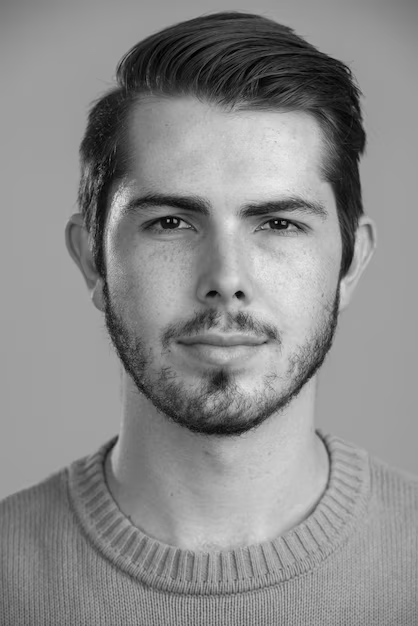

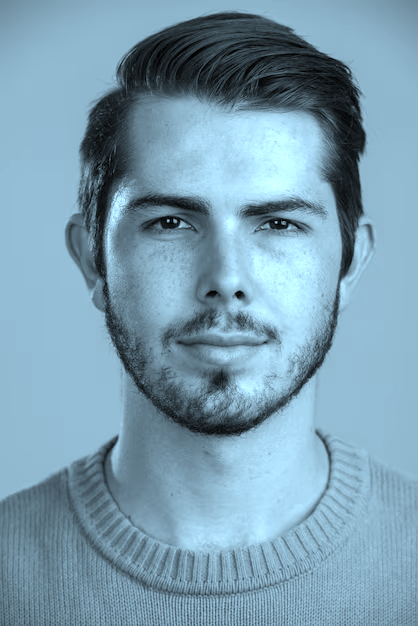

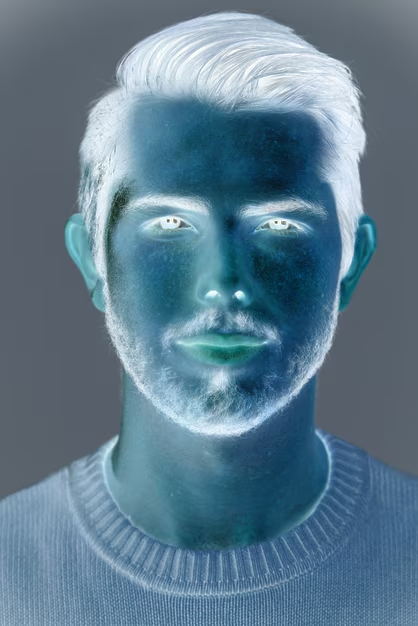

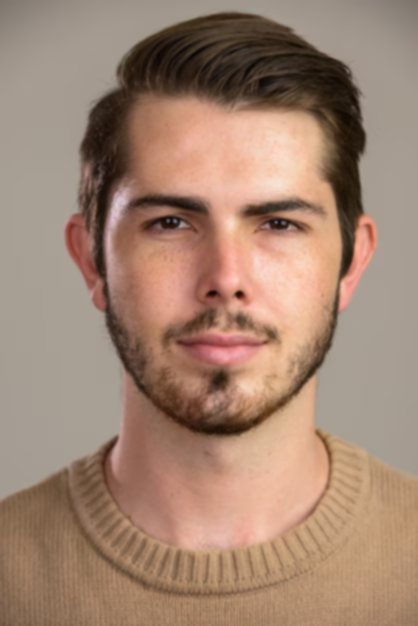

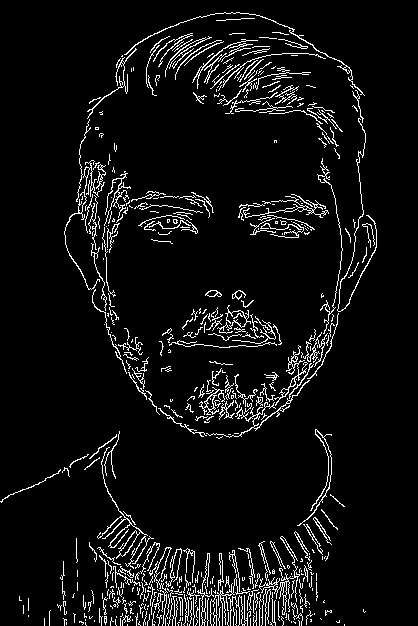

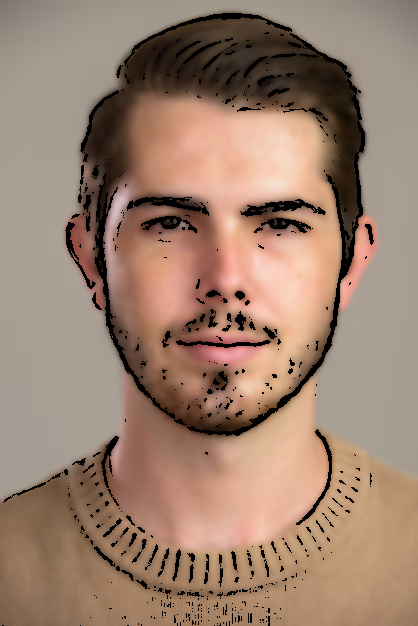

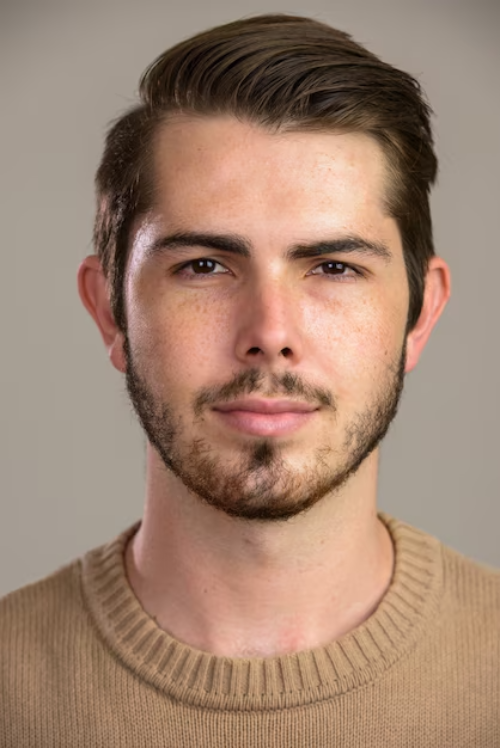

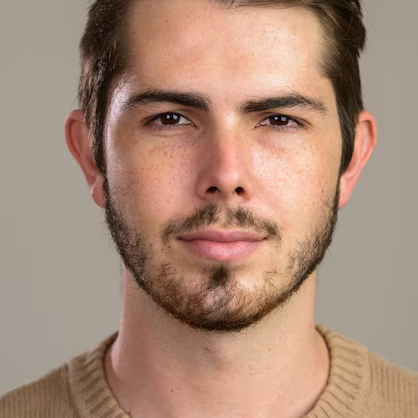

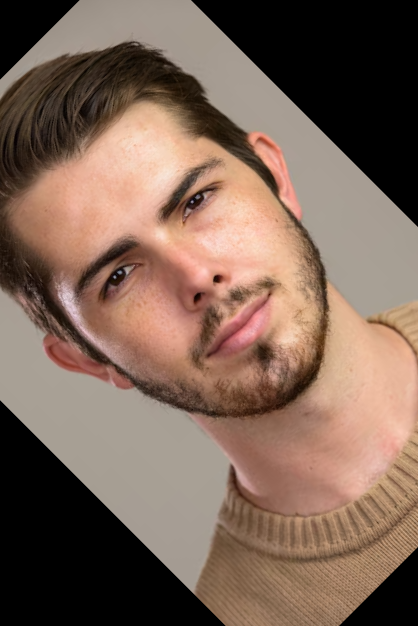

In [ ]:
cv2_imshow(grayscale_img)
cv2_imshow(sepia_img)
cv2_imshow(negative_img)
cv2_imshow(blur_img)
cv2_imshow(edges_img)
cv2_imshow(cartoon_img)
cv2_imshow(resized_img)
cv2_imshow(cropped_img)
cv2_imshow(rotated_img)

# Experiment - 3 - Playing with Image - II

## Image Resolution and Interpolation Studies

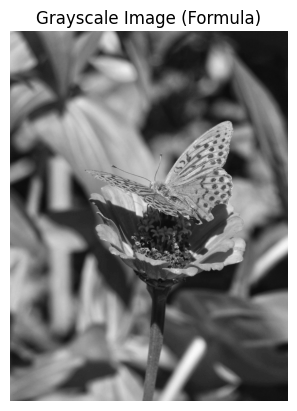

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/image.jpg')

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

R = image_rgb[:, :, 0]
G = image_rgb[:, :, 1]
B = image_rgb[:, :, 2]

gray_image = 0.299 * R + 0.587 * G + 0.114 * B
gray_image = gray_image.astype(np.uint8)

plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image (Formula)")
plt.axis('off')
plt.show()

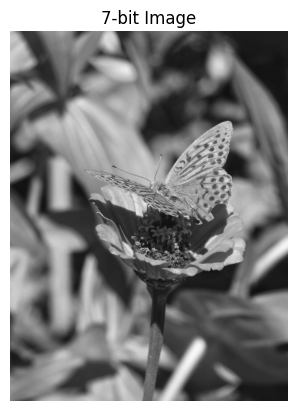

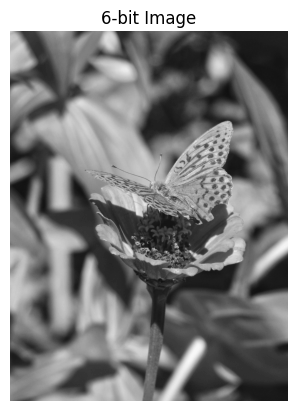

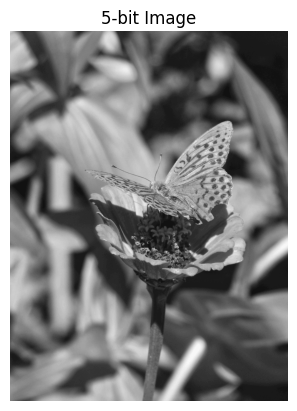

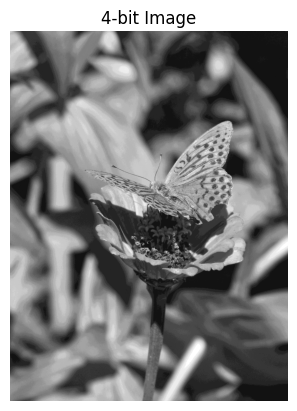

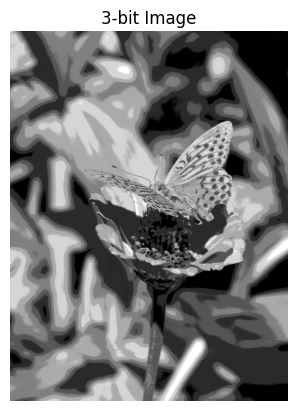

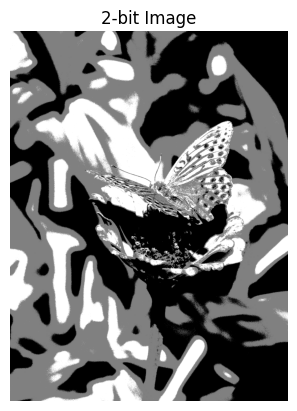

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('/content/image.jpg', cv2.IMREAD_GRAYSCALE)

def reduce_intensity_resolution(image, bits):
    max_intensity = 2**bits - 1
    return np.uint8((image / 256) * max_intensity)

bit_depths = [7, 6, 5, 4, 3, 2]
for bits in bit_depths:
    reduced_image = reduce_intensity_resolution(image, bits)
    plt.imshow(reduced_image, cmap='gray')
    plt.title(f"{bits}-bit Image")
    plt.axis('off')
    plt.show()


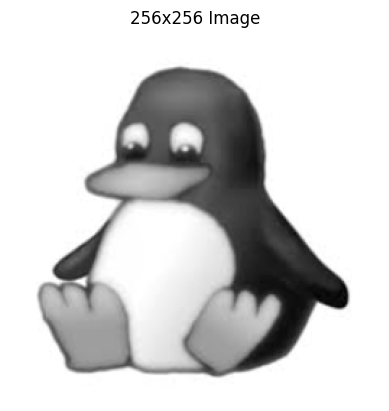

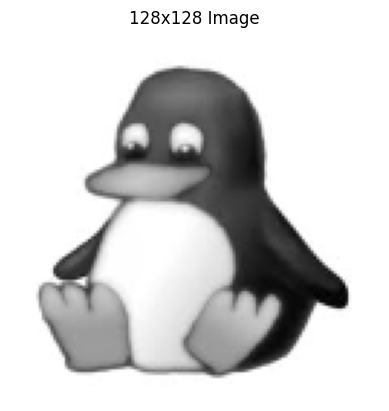

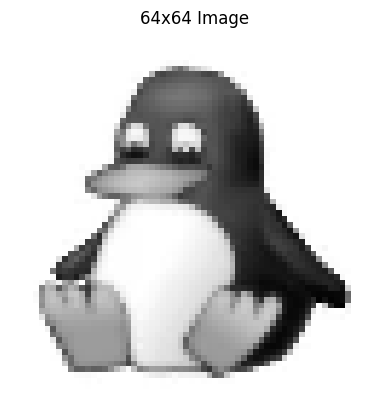

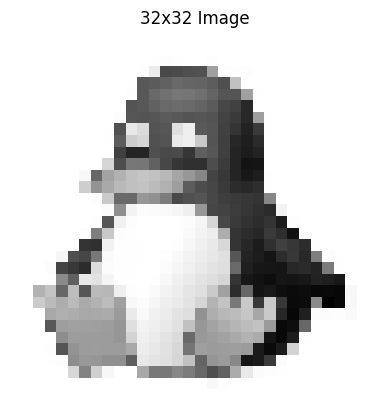

In [ ]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('/content/penguin.jpg', cv2.IMREAD_GRAYSCALE)

def resize_image(image, size):
    return cv2.resize(image, (size, size), interpolation=cv2.INTER_LINEAR)

sizes = [256, 128, 64, 32]
for size in sizes:
    resized_image = resize_image(image, size)
    plt.imshow(resized_image, cmap='gray')
    plt.title(f"{size}x{size} Image")
    plt.axis('off')
    plt.show()
    cv2.imwrite(f'{size}x{size}_image.jpg', resized_image)


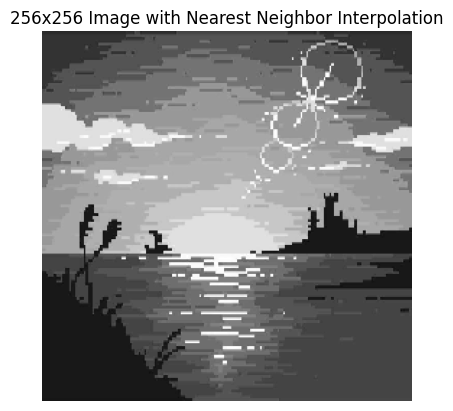

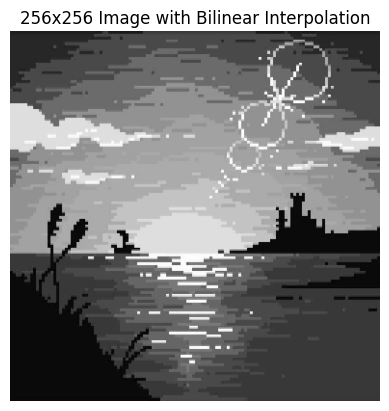

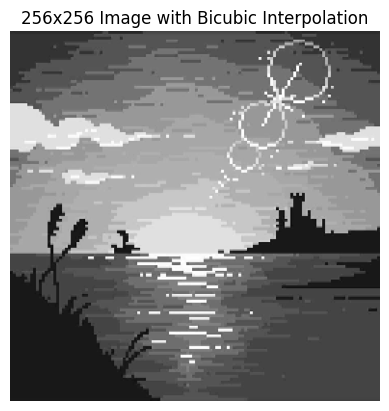

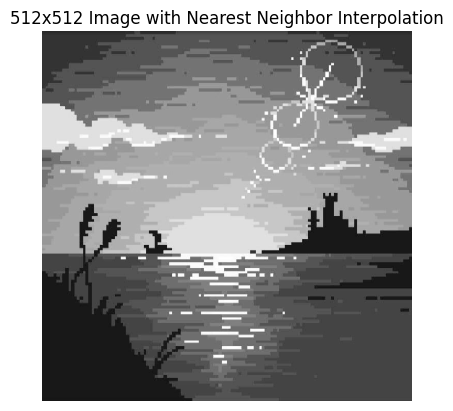

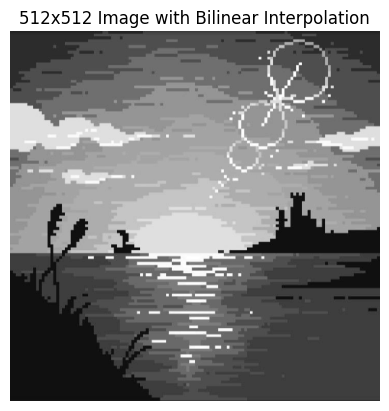

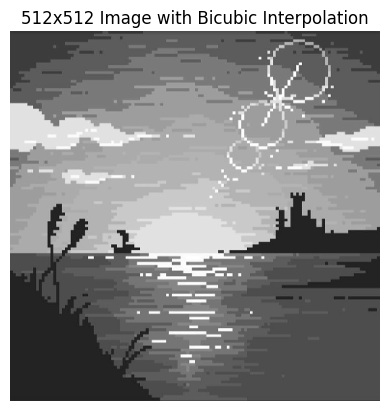

In [ ]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('/content/sunset.jpg', cv2.IMREAD_GRAYSCALE)

def upscale_image(image, new_size, interpolation_method):
    return cv2.resize(image, (new_size, new_size), interpolation=interpolation_method)
interpolation_methods = {
    'Nearest Neighbor': cv2.INTER_NEAREST,
    'Bilinear': cv2.INTER_LINEAR,
    'Bicubic': cv2.INTER_CUBIC
}

sizes = [256, 512]
for size in sizes:
    for method_name, method in interpolation_methods.items():
        upscaled_image = upscale_image(image, size, method)
        plt.imshow(upscaled_image, cmap='gray')
        plt.title(f"{size}x{size} Image with {method_name} Interpolation")
        plt.axis('off')
        plt.show()
        cv2.imwrite(f'{size}x{size}_{method_name}_interpolation.jpg', upscaled_image)


# Experiment - 4 - Filters and Blurs

## Filtering with a Box Filter with Different Kernel Sizes

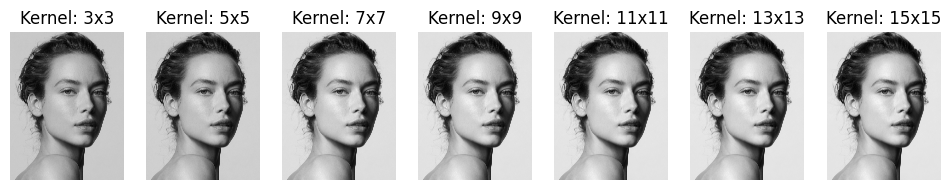

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('sample.jpeg', cv2.IMREAD_GRAYSCALE)


kernel_sizes = [3, 5, 7, 9, 11, 13, 15]
filtered_images = []

for size in kernel_sizes:
    kernel = np.ones((size, size), np.float32) / (size * size)
    filtered = cv2.filter2D(image, -1, kernel)
    filtered_images.append(filtered)

plt.figure(figsize=(12, 6))
for i, filtered in enumerate(filtered_images):
    plt.subplot(1, len(filtered_images), i + 1)
    plt.title(f"Kernel: {kernel_sizes[i]}x{kernel_sizes[i]}")
    plt.imshow(filtered, cmap='gray')
    plt.axis('off')
plt.show()

## Simulate a Defocus Blurred Image

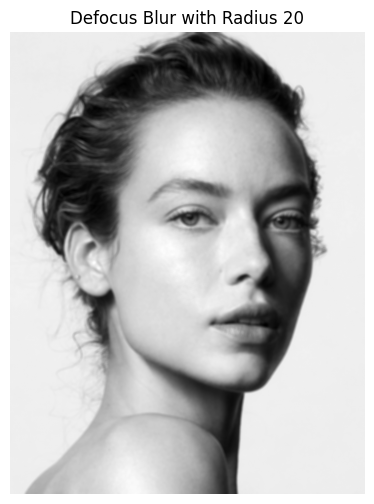

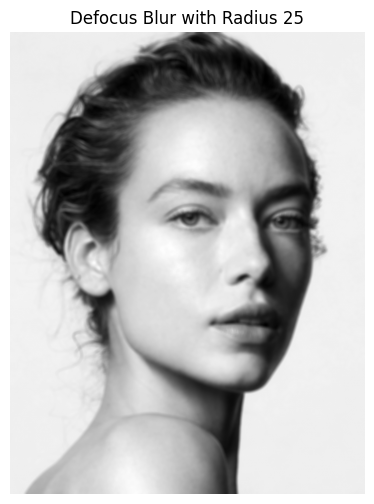

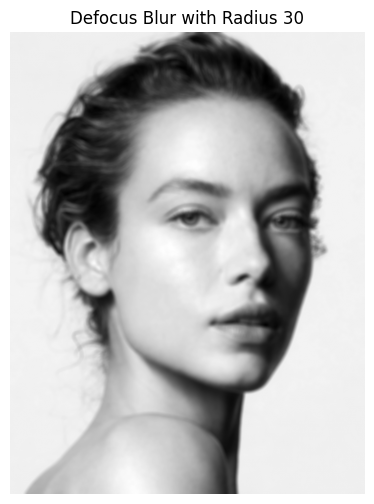

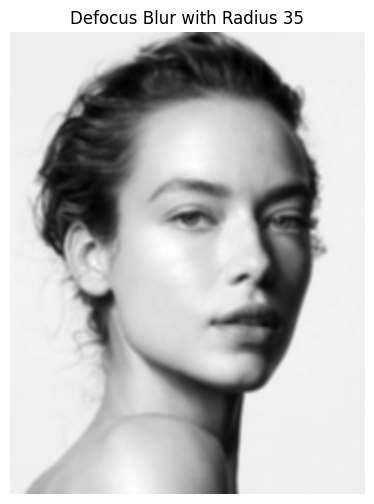

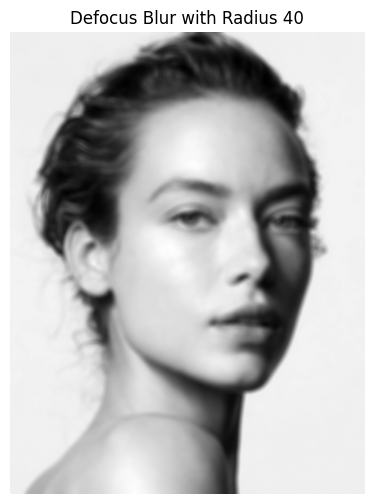

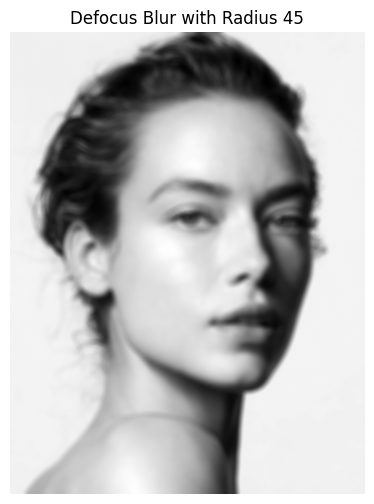

In [ ]:
image = cv2.imread('sample.jpeg', cv2.IMREAD_GRAYSCALE)


def circular_kernel(radius):
    y, x = np.ogrid[-radius:radius+1, -radius:radius+1]
    mask = x**2 + y**2 <= radius**2
    kernel = np.zeros_like(mask, dtype=np.float32)
    kernel[mask] = 1
    kernel /= kernel.sum()
    return kernel

radius = [20, 25, 30, 35, 40, 45]

for rad in radius:
  kernel = circular_kernel(rad)
  blurred_image = cv2.filter2D(image, -1, kernel)


  plt.figure(figsize=(6, 6))
  plt.title(f"Defocus Blur with Radius {rad}")
  plt.imshow(blurred_image, cmap='gray')
  plt.axis('off')
  plt.show()


## Motion Blur - Use Your Own Kernel & Blur Image

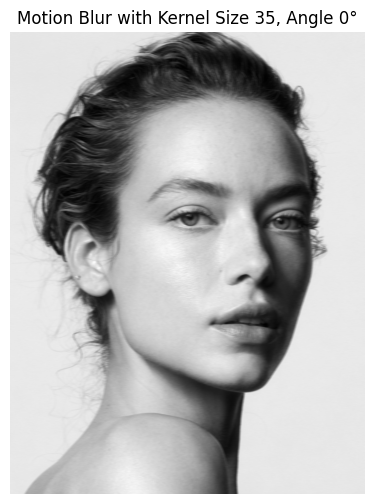

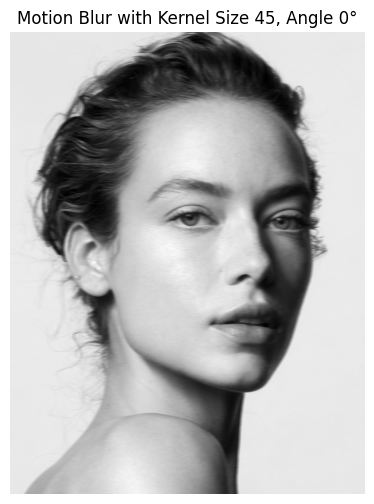

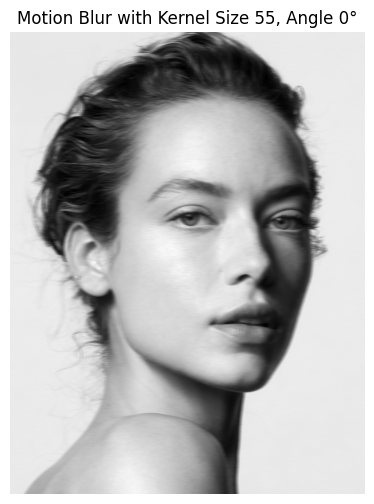

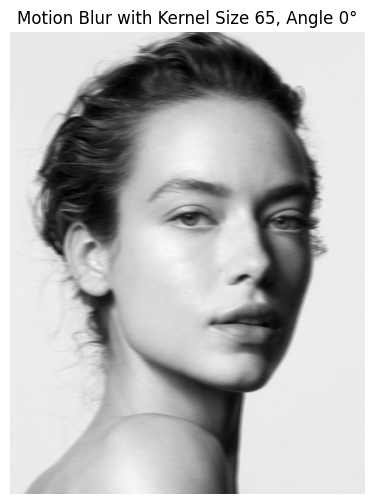

In [ ]:

image = cv2.imread('sample.jpeg', cv2.IMREAD_GRAYSCALE)

def motion_blur_kernel(size, angle):
    kernel = np.zeros((size, size), dtype=np.float32)
    mid = size // 2
    if angle == 0:
        kernel[mid, :] = 1
    elif angle == 90:
        kernel[:, mid] = 1
    elif angle == 45:
        np.fill_diagonal(kernel, 1)
    else:
        raise ValueError("Only angles 0, 90, and 45 are supported")
    kernel /= kernel.sum()
    return kernel

kernel_size = [35, 45, 55, 65]
angle = 0
for ker in kernel_size:
  kernel = motion_blur_kernel(ker, angle)
  motion_blurred_image = cv2.filter2D(image, -1, kernel)

  plt.figure(figsize=(6, 6))
  plt.title(f"Motion Blur with Kernel Size {ker}, Angle {angle}°")
  plt.imshow(motion_blurred_image, cmap='gray')
  plt.axis('off')
  plt.show()


## Correlation vs Convolution

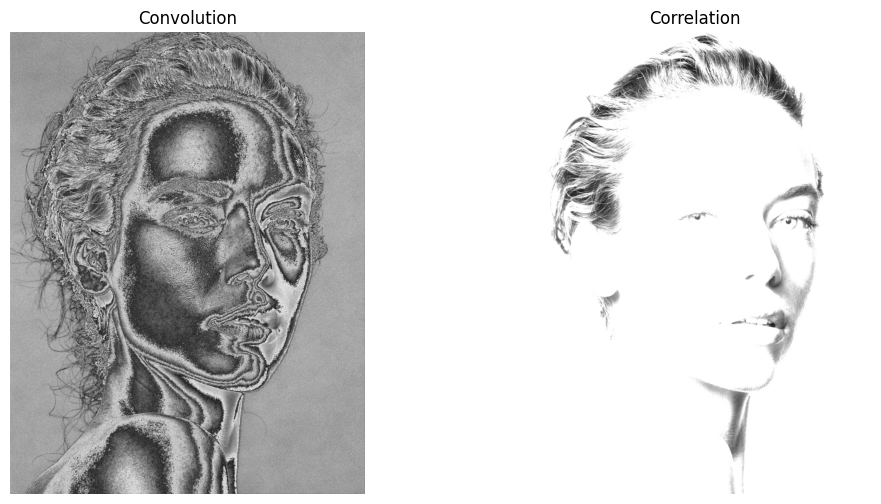

In [ ]:
from scipy import ndimage

image = cv2.imread('sample.jpeg', 0)

kernel = np.array([[1,1,1],[1,1,0],[1,0,0]])

#convolved_image = cv2.filter2D(image, -1, kernel)
convolved_image = ndimage.convolve(image, kernel, mode='constant', cval=1.0)

correlated_image = cv2.filter2D(image, -1, kernel)
#correlated_image = cv2.filter2D(image, -1, np.flip(kernel))


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Convolution")
plt.imshow(convolved_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Correlation")
plt.imshow(correlated_image, cmap='gray')
plt.axis('off')
plt.show()


## Separable Filters

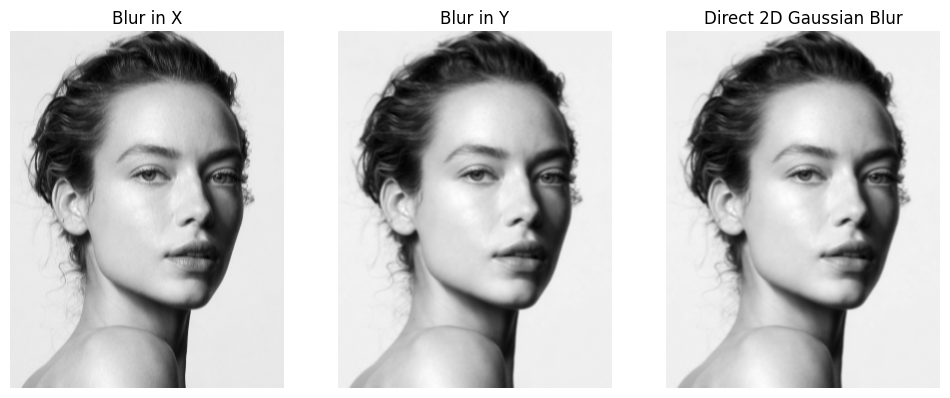

In [ ]:
image = cv2.imread('sample.jpeg', 0)


def gaussian_kernel(size, sigma):
    k = cv2.getGaussianKernel(size, sigma)
    kernel_2d = np.outer(k, k)
    return kernel_2d

size = 55
sigma = 15.0


kernel_2d = gaussian_kernel(size, sigma)
filter_x = cv2.getGaussianKernel(size, sigma)
filter_y = filter_x.T  # Transpose for vertical filtering

blur_x = cv2.filter2D(image, -1, filter_x)
blur_y = cv2.filter2D(blur_x, -1, filter_y)

gaussian_blur = cv2.filter2D(image, -1, kernel_2d)

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Blur in X")
plt.imshow(blur_x, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blur in Y")
plt.imshow(blur_y, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Direct 2D Gaussian Blur")
plt.imshow(gaussian_blur, cmap='gray')
plt.axis('off')
plt.show()


## Gaussian Distribution with Different Sigma and Mean Value as 0

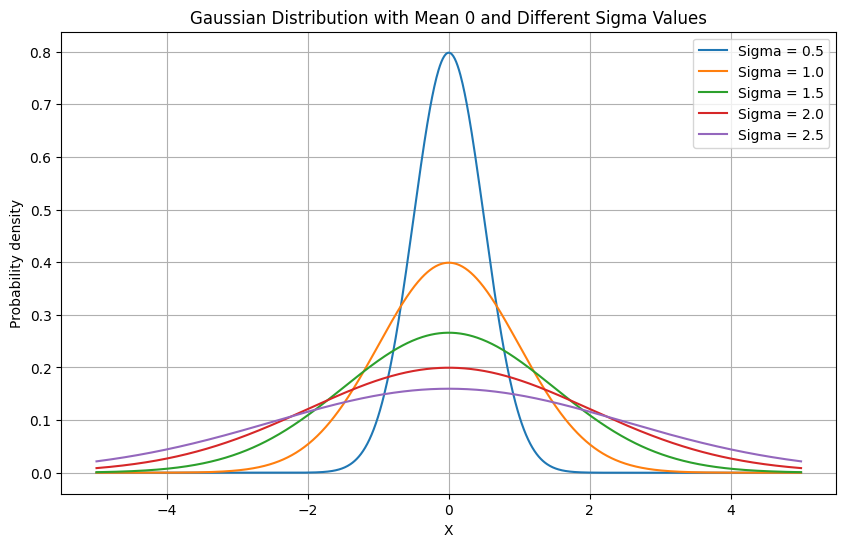

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

mu = 0  # Mean
sigma_values = [0.5, 1.0, 1.5, 2.0, 2.5,]

x = np.linspace(-5, 5, 1000)

plt.figure(figsize=(10, 6))
for sigma in sigma_values:
    y = 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(-(x - mu)**2 / (2 * sigma**2))
    plt.plot(x, y, label=f'Sigma = {sigma}')


plt.title('Gaussian Distribution with Mean 0 and Different Sigma Values')
plt.xlabel('X')
plt.ylabel('Probability density')
plt.legend()
plt.grid(True)
plt.show()


# Experiment - 5 - Gaussian Kernels

## Filter an image using Gaussian Filter

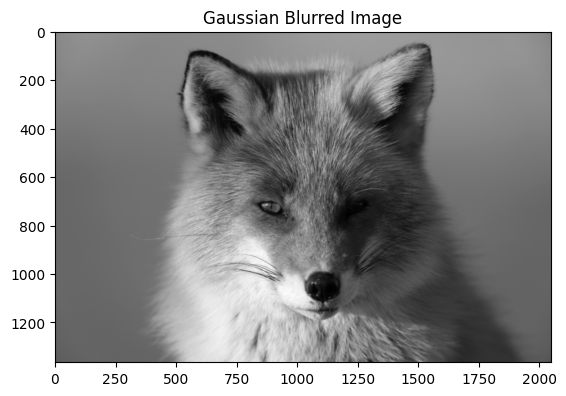

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/fox_sample.jpeg', cv2.IMREAD_GRAYSCALE)
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
cv2.imwrite('blurred_image.jpg', blurred_image)
plt.imshow(blurred_image, cmap='gray')
plt.title('Gaussian Blurred Image')
plt.show()

## Generating Points from Standard Normal Distribution

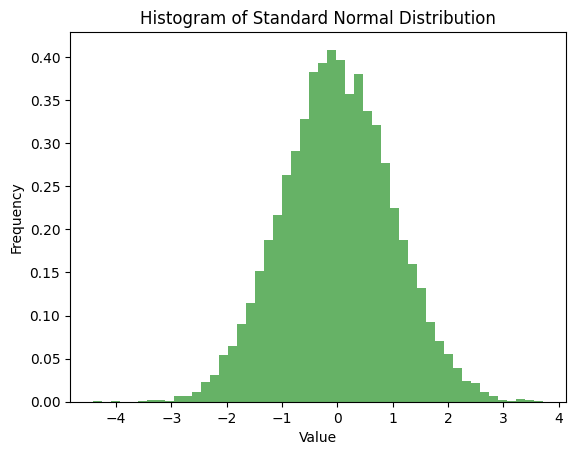

In [ ]:
data = np.random.randn(10000)

plt.hist(data, bins=50, density=True, alpha=0.6, color='g')
plt.title("Histogram of Standard Normal Distribution")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()

## Guassian Blurring

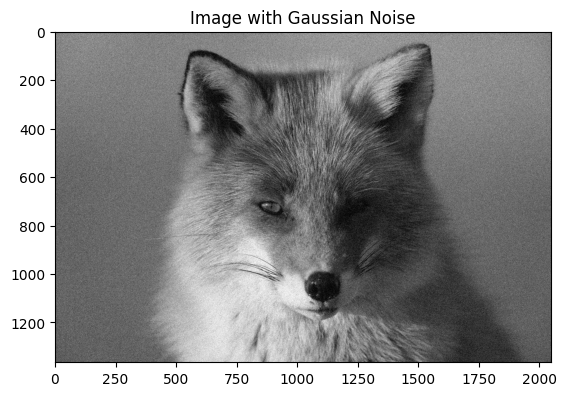

In [ ]:
mean = 0
sigma = 25
gaussian_noise = np.random.normal(mean, sigma, image.shape)
noisy_image = np.clip(image + gaussian_noise, 0, 255).astype(np.uint8)


cv2.imwrite('noisy_image.jpg', noisy_image)
plt.imshow(noisy_image, cmap='gray')
plt.title('Image with Gaussian Noise')
plt.show()


# Experiment 6 - Histogram Equalization

## Obtain histogram of an image

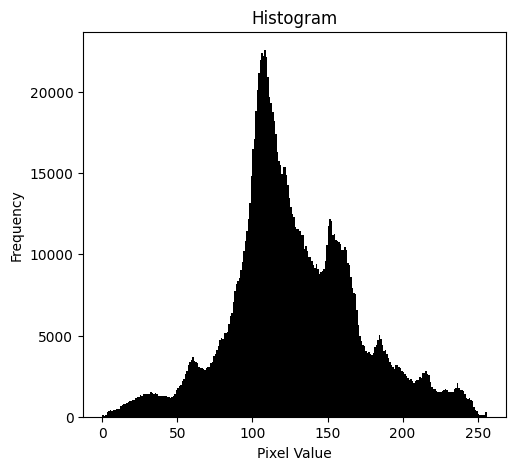

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(image, title, subplot_pos):
    plt.subplot(1, 2, subplot_pos)
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
    plt.title(title)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

image = cv2.imread('/content/sample.jpeg', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12, 5))
plot_histogram(image, "Histogram", 1)
plt.show()

## Perfrom Histogram Equalization

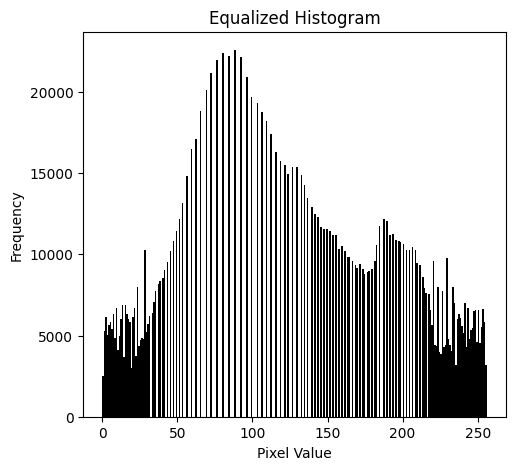

In [ ]:
image = cv2.imread('/content/sample.jpeg', cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(image)
plt.figure(figsize=(12, 5))
plot_histogram(equalized_image, "Equalized Histogram", 2)
plt.show()

## Comparison between Original and Equalized Images

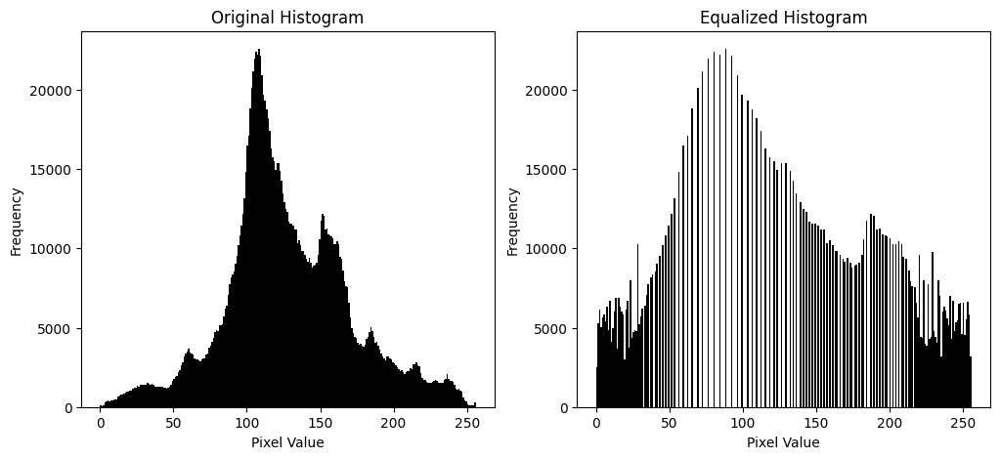

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(image, title, subplot_pos):
    plt.subplot(1, 2, subplot_pos)
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
    plt.title(title)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")


image = cv2.imread('/content/sample.jpeg', cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(12, 5))
plot_histogram(image, "Original Histogram", 1)

equalized_image = cv2.equalizeHist(image)

plot_histogram(equalized_image, "Equalized Histogram", 2)

plt.show()

## Histogram Modification

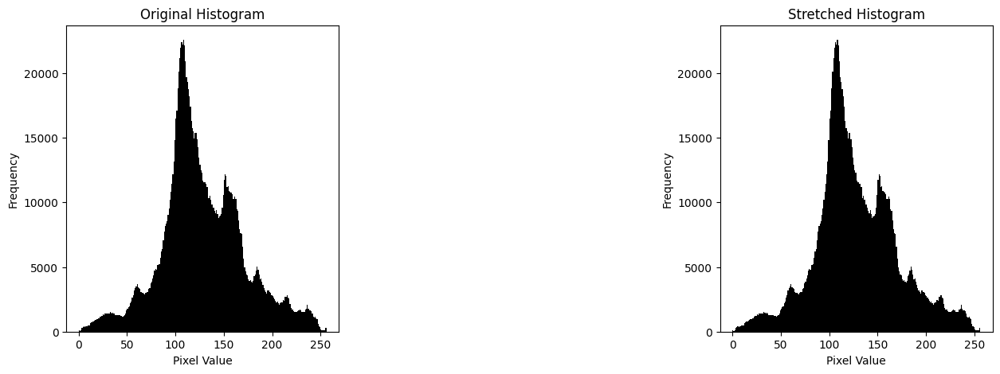

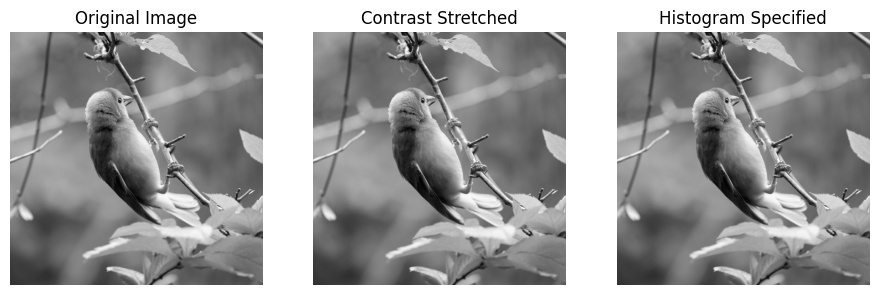

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(image, title, subplot_pos):
    plt.subplot(1, 3, subplot_pos)
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
    plt.title(title)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

def contrast_stretching(image):
    min_val = np.min(image)
    max_val = np.max(image)
    stretched = ((image - min_val) / (max_val - min_val) * 255).astype(np.uint8)
    return stretched

def histogram_specification(image, reference):
    image_hist, _ = np.histogram(image.flatten(), 256, [0, 256])
    reference_hist, _ = np.histogram(reference.flatten(), 256, [0, 256])

    cdf_image = np.cumsum(image_hist).astype(np.float32)
    cdf_image /= cdf_image[-1]

    cdf_reference = np.cumsum(reference_hist).astype(np.float32)
    cdf_reference /= cdf_reference[-1]

    mapping = np.interp(cdf_image, cdf_reference, np.arange(256))

    matched_image = mapping[image.flatten()].reshape(image.shape).astype(np.uint8)
    return matched_image


image = cv2.imread('/content/sample.jpeg', cv2.IMREAD_GRAYSCALE)
stretched_image = contrast_stretching(image)

specified_image = histogram_specification(image, stretched_image)

plt.figure(figsize=(15, 5))
plot_histogram(image, "Original Histogram", 1)
plot_histogram(stretched_image, "Stretched Histogram", 3)
plt.show()

plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(stretched_image, cmap='gray')
plt.title("Contrast Stretched")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(specified_image, cmap='gray')
plt.title("Histogram Specified")
plt.axis("off")

plt.show()

# Experiment 7 - Frequency Domain Filters

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Fourier Transforming, Filtering, Inverse Filtering

In [ ]:
def apply_filter(image, filter_type, cutoff):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2

    dft = np.fft.fft2(image)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = np.log(1 + np.abs(dft_shift))

    mask = np.zeros((rows, cols), np.float32)

    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow) ** 2 + (v - ccol) ** 2)
            if filter_type == 'box':
                mask[u, v] = 1 if D <= cutoff else 0
            elif filter_type == 'gaussian':
                mask[u, v] = np.exp(-(D**2) / (2 * (cutoff**2)))
            elif filter_type == 'lowpass':
                mask[u, v] = 1 if D <= cutoff else 0

    filtered_dft = dft_shift * mask
    dft_ishift = np.fft.ifftshift(filtered_dft)
    img_back = np.fft.ifft2(dft_ishift)
    img_back = np.abs(img_back)

    return magnitude_spectrum, mask, np.log(1 + np.abs(filtered_dft)), img_back

In [ ]:
image = cv2.imread('/content/sample.jpg', cv2.IMREAD_GRAYSCALE)
filters = ['box', 'gaussian', 'lowpass']
cutoff = 50

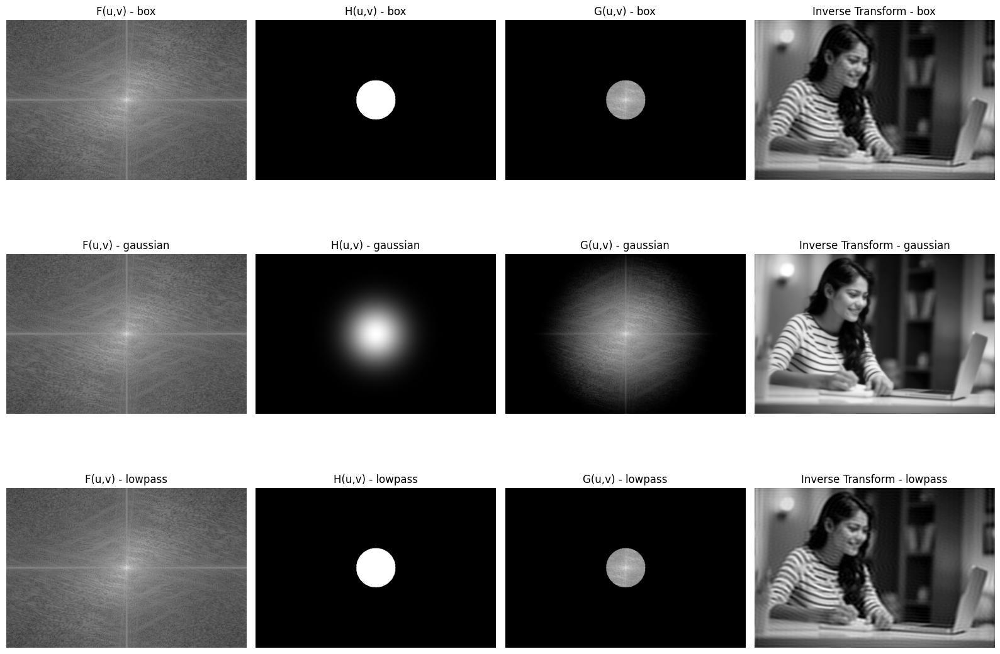

In [ ]:
fig, axs = plt.subplots(len(filters), 4, figsize=(16, 12))

for i, filter_type in enumerate(filters):
    F_uv, H_uv, G_uv, result = apply_filter(image, filter_type, cutoff)

    axs[i, 0].imshow(F_uv, cmap='gray')
    axs[i, 0].set_title(f'F(u,v) - {filter_type}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(H_uv, cmap='gray')
    axs[i, 1].set_title(f'H(u,v) - {filter_type}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(G_uv, cmap='gray')
    axs[i, 2].set_title(f'G(u,v) - {filter_type}')
    axs[i, 2].axis('off')

    axs[i, 3].imshow(result, cmap='gray')
    axs[i, 3].set_title(f'Inverse Transform - {filter_type}')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()

# Experiment - 8 - Discrete Wavelet Transformation & Discrete Cosine Transformation/Compression

## Manual DCT Calculation

In [ ]:
import numpy as np
from scipy.fftpack import dct

x = np.array([11, 22, 33, 44])
N = len(x)

X_dct_manual = np.zeros(N)
for k in range(N):
    sum_val = 0
    for n in range(N):
        sum_val += x[n] * np.cos(np.pi * k * (2*n + 1) / (2 * N))

    if k == 0:
        X_dct_manual[k] = sum_val * np.sqrt(1 / N)
    else:
        X_dct_manual[k] = sum_val * np.sqrt(2 / N)

X_dct_scipy = dct(x, type=2, norm='ortho')

print("DCT (Manual Calculation):", X_dct_manual)
print("DCT (SciPy Implementation):", X_dct_scipy)

DCT (Manual Calculation): [ 5.50000000e+01 -2.45348675e+01 -7.53644380e-15 -1.74363935e+00]
DCT (SciPy Implementation): [ 55.         -24.53486747   0.          -1.74363935]


In [ ]:
import numpy as np
from scipy.fftpack import dct, idct

x = np.array([11, 22, 33, 44])
N = len(x)

X_dct_manual = np.zeros(N)
for k in range(N):
    sum_val = 0
    for n in range(N):
        sum_val += x[n] * np.cos(np.pi * k * (2*n + 1) / (2 * N))

    if k == 0:
        X_dct_manual[k] = sum_val * np.sqrt(1 / N)
    else:
        X_dct_manual[k] = sum_val * np.sqrt(2 / N)

X_dct_scipy = dct(x, type=2, norm='ortho')

print("DCT (Manual):", X_dct_manual)
print("DCT (SciPy):", X_dct_scipy)

x_reconstructed_full = idct(X_dct_scipy, type=2, norm='ortho')
print("Inverse DCT: ", x_reconstructed_full)

X_dct_scipy_lowpass = X_dct_scipy.copy()
X_dct_scipy_lowpass[2:] = 0

print("Modified DCT", X_dct_scipy_lowpass)

x_reconstructed_lowpass = idct(X_dct_scipy_lowpass, type=2, norm='ortho')
print("Inverse DCT:", x_reconstructed_lowpass)


DCT (Manual): [ 5.50000000e+01 -2.45348675e+01 -7.53644380e-15 -1.74363935e+00]
DCT (SciPy): [ 55.         -24.53486747   0.          -1.74363935]
Inverse DCT:  [11. 22. 33. 44.]
Modified DCT [ 55.         -24.53486747   0.           0.        ]
Inverse DCT: [11.47182541 20.8609127  34.1390873  43.52817459]


## Verify DCT's Energy Compaction Property

### Given Sequence

In [ ]:
energy_x = np.sum(x**2)

energy_X_dct = np.sum(X_dct_scipy**2)

print("Energy of original sequence:", energy_x)
print("Energy of DCT coefficients:", energy_X_dct)


Energy of original sequence: 3630
Energy of DCT coefficients: 3630.000000000001


### For an Image

Energy in Spatial Domain: 258309640000.0
Energy in DCT Domain: 258307720000.0
Energy Retention Ratio (Image): 0.99999255


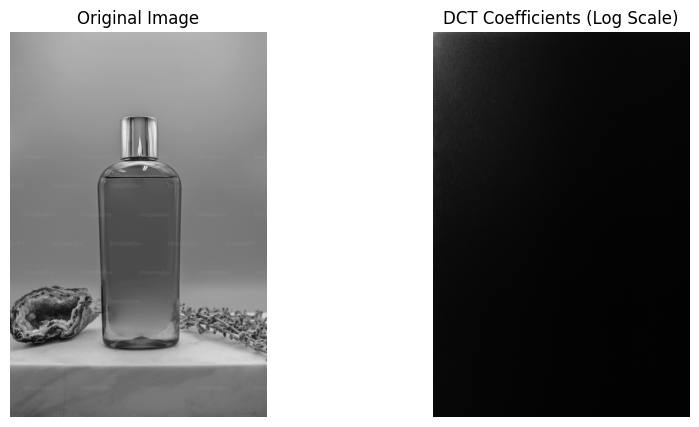

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("sample.jpeg", cv2.IMREAD_GRAYSCALE)


energy_spatial = np.sum(image.astype(np.float32) ** 2)


dct_image = cv2.dct(np.float32(image))

energy_dct_image = np.sum(dct_image ** 2)

print("Energy in Spatial Domain:", energy_spatial)
print("Energy in DCT Domain:", energy_dct_image)
print("Energy Retention Ratio (Image):", energy_dct_image / energy_spatial)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(np.log1p(np.abs(dct_image)), cmap='gray')
plt.title("DCT Coefficients (Log Scale)")
plt.axis("off")

plt.show()

Energy in Spatial Domain: 258309640000.0
Energy in DCT Domain (Full): 258307720000.0
Energy in Modified DCT: 258305850000.0


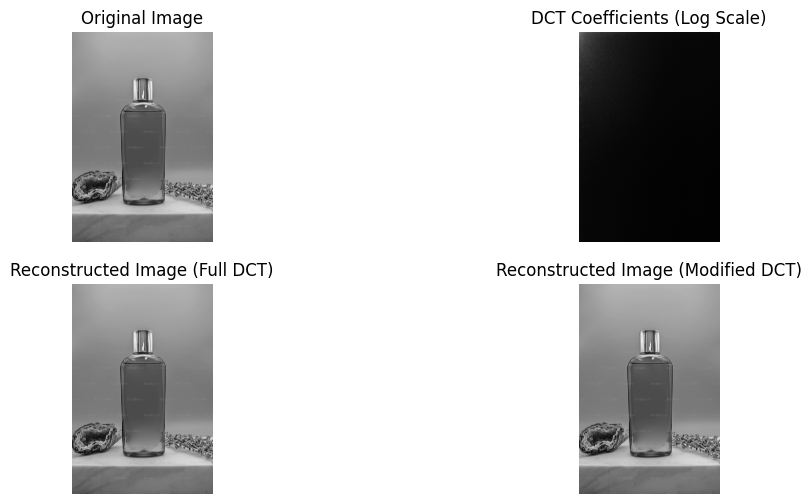

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("sample.jpeg", cv2.IMREAD_GRAYSCALE)
image = np.float32(image)


dct_image = cv2.dct(image)

idct_image_full = cv2.idct(dct_image)

dct_image_modified = dct_image.copy()
h, w = dct_image.shape
dct_image_modified[h//4:3*h//4, w//4:3*w//4] = 0

idct_image_modified = cv2.idct(dct_image_modified)

energy_spatial = np.sum(image ** 2)
energy_dct = np.sum(dct_image ** 2)
energy_dct_modified = np.sum(dct_image_modified ** 2)

print("Energy in Spatial Domain:", energy_spatial)
print("Energy in DCT Domain (Full):", energy_dct)
print("Energy in Modified DCT:", energy_dct_modified)

plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(np.log1p(np.abs(dct_image)), cmap='gray')
plt.title("DCT Coefficients (Log Scale)")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(idct_image_full, cmap='gray')
plt.title("Reconstructed Image (Full DCT)")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(idct_image_modified, cmap='gray')
plt.title("Reconstructed Image (Modified DCT)")
plt.axis("off")

plt.show()


## DFT vs DCT

In [ ]:
from scipy.fft import fft


X_dft = fft(x)

print("DFT Coefficients:", X_dft)
print("DCT Coefficients:", X_dct_scipy)

energy_dft = np.sum(np.abs(X_dft)**2)
print("Energy of DFT Coefficients:", energy_dft)


DFT Coefficients: [110. -0.j -22.+22.j -22. -0.j -22.-22.j]
DCT Coefficients: [ 55.         -24.53486747   0.          -1.74363935]
Energy of DFT Coefficients: 14520.0


## DWT Implementation

In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.9 MB/s eta 0:00:00


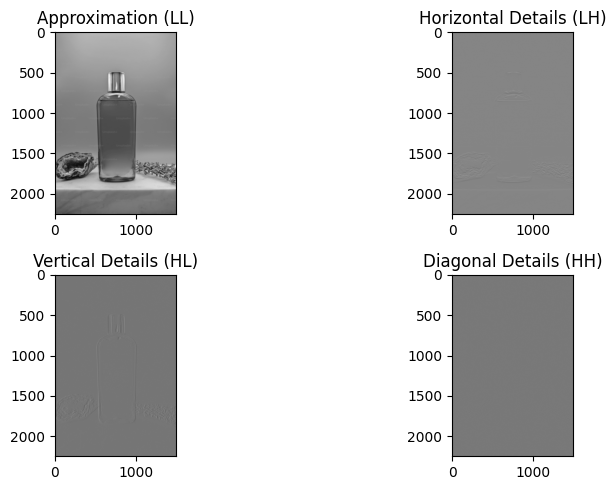

In [ ]:
import cv2
import numpy as np
import pywt
import matplotlib.pyplot as plt

image = cv2.imread('sample.jpeg', cv2.IMREAD_GRAYSCALE)


coeffs2 = pywt.dwt2(image, 'haar')
LL, (LH, HL, HH) = coeffs2

plt.figure(figsize=(10, 5))

plt.subplot(2, 2, 1)
plt.imshow(LL, cmap='gray')
plt.title("Approximation (LL)")

plt.subplot(2, 2, 2)
plt.imshow(LH, cmap='gray')
plt.title("Horizontal Details (LH)")

plt.subplot(2, 2, 3)
plt.imshow(HL, cmap='gray')
plt.title("Vertical Details (HL)")

plt.subplot(2, 2, 4)
plt.imshow(HH, cmap='gray')
plt.title("Diagonal Details (HH)")

plt.tight_layout()
plt.show()


## Implementation of DCT

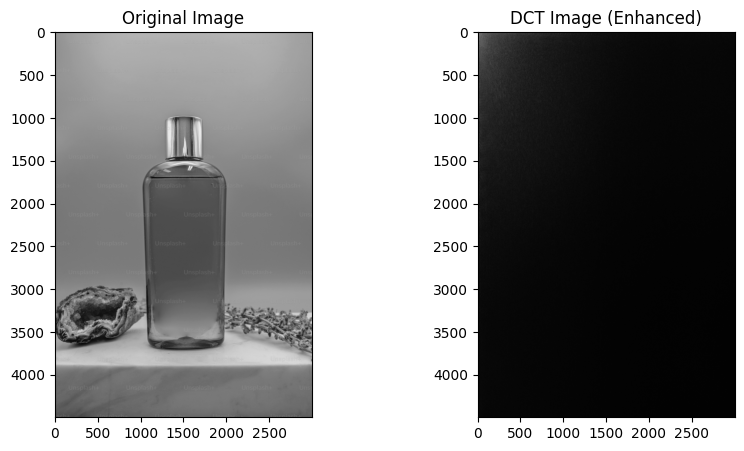

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import dct, idct

image = cv2.imread('sample.jpeg', cv2.IMREAD_GRAYSCALE)


dct_image = dct(dct(image.T, norm='ortho').T, norm='ortho')

dct_visual = np.log1p(np.abs(dct_image))
dct_visual = dct_visual / np.max(dct_visual)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(dct_visual, cmap='gray')
plt.title("DCT Image (Enhanced)")

plt.show()


# Experiment - 9 - Denoising using DWT

In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 90.6 MB/s eta 0:00:00


In [ ]:
import cv2
import pywt
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def add_gaussian_noise(image, mean=0, sigma=50):
    noisy_image = image + np.random.normal(mean, sigma, image.shape)
    return np.clip(noisy_image, 0, 255).astype(np.uint8)

In [ ]:
def dwt_denoise(image, wavelet='haar', level=1, thresholding='soft'):
    coeffs = pywt.wavedec2(image, wavelet, level=level)
    cA, cD = coeffs[0], coeffs[1:]
    sigma = np.median(np.abs(cD[-1][0])) / 0.6745
    threshold = sigma * np.sqrt(2 * np.log(image.size))
    def threshold_coeffs(detail_coeffs, threshold, method):
        return [(pywt.threshold(cH, threshold, method),
                 pywt.threshold(cV, threshold, method),
                 pywt.threshold(cD, threshold, method)) for (cH, cV, cD) in detail_coeffs]

    cD_thresh = threshold_coeffs(cD, threshold, thresholding)
    coeffs_reconstructed = [cA] + cD_thresh
    denoised_img = pywt.waverec2(coeffs_reconstructed, wavelet)
    denoised_img = np.clip(denoised_img, 0, 255).astype(np.uint8)

    return denoised_img

In [ ]:
def process_image(image_path, wavelet='db1', level=2, thresholding='soft'):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError("Image not found or cannot be loaded.")
    noisy_img = add_gaussian_noise(img)
    denoised_img = dwt_denoise(noisy_img, wavelet, level, thresholding)
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title('Noisy Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(denoised_img, cmap='gray')
    plt.title('Denoised Image')
    plt.axis('off')

    plt.show()
    return noisy_img, denoised_img

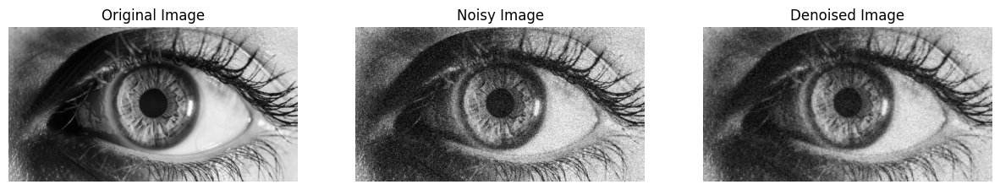

(array([[204, 237, 116, ..., 255, 255, 255],
        [218, 215, 241, ..., 194, 255, 213],
        [163, 160, 237, ..., 250, 190, 175],
        ...,
        [116, 199, 198, ..., 224, 255, 166],
        [206, 148,  96, ..., 232, 193, 232],
        [255, 139, 241, ..., 242, 186, 209]], dtype=uint8),
 array([[184, 184, 184, ..., 220, 220, 220],
        [184, 184, 184, ..., 220, 220, 220],
        [184, 184, 184, ..., 220, 220, 220],
        ...,
        [177, 177, 177, ..., 214, 214, 214],
        [200, 200, 200, ..., 218, 218, 218],
        [200, 200, 200, ..., 218, 218, 218]], dtype=uint8))

In [ ]:
process_image('sample.jpg', wavelet='db1', level=2, thresholding='soft')

# Experiment - 10 - Image Restoration

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import wiener
from scipy.ndimage import gaussian_filter
from skimage.metrics import peak_signal_noise_ratio as psnr

In [84]:
def degrade_image(image):
    blurred = cv2.GaussianBlur(image, (3, 3), 0)
    noise = np.random.normal(0, 10, image.shape).astype(np.uint8)
    degraded = cv2.add(blurred, noise)
    return blurred, degraded

In [85]:
image = cv2.imread('flower.jpg', cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (256, 256))

blurred, degraded = degrade_image(image)

## Inverse Filtering

In [86]:
def inverse_filtering(degraded, kernel):
    H = np.fft.fft2(kernel, s=degraded.shape)
    G = np.fft.fft2(degraded)
    restored = np.fft.ifft2(G / (H + 20))
    return np.abs(restored)


kernel = cv2.getGaussianKernel(3, 0)
kernel = np.outer(kernel, kernel)
inverse_restored = inverse_filtering(degraded, kernel)

<ipython-input-87-9a16350f7131>:10: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_inv = psnr(image, inverse_restored)


PSNR (Inverse): 15.06 dB


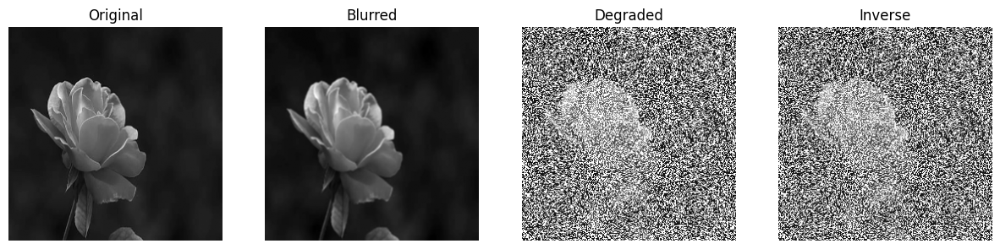

In [87]:
fig, axes = plt.subplots(1, 4, figsize=(15, 9))
images = [image, blurred, degraded, inverse_restored]
titles = ["Original", "Blurred", "Degraded", "Inverse"]

for i, ax in enumerate(axes.flat[:4]):
    ax.imshow(images[i], cmap='gray')
    ax.set_title(titles[i])
    ax.axis('off')

psnr_inv = psnr(image, inverse_restored)
print(f"PSNR (Inverse): {psnr_inv:.2f} dB")

## Wiener Filtering

In [70]:
def wiener_filtering(degraded, kernel, K=1):
    H = np.fft.fft2(kernel, s=degraded.shape)
    G = np.fft.fft2(degraded)
    H_conj = np.conj(H)
    restored = np.fft.ifft2((H_conj / (H * H_conj + K)) * G)
    return np.abs(restored)

kernel = cv2.getGaussianKernel(3, 0)
kernel = np.outer(kernel, kernel)
wiener_restored = wiener_filtering(degraded, kernel)

<ipython-input-71-a95ce7e8380e>:10: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_wiener = psnr(image, wiener_restored)


PSNR (Wiener): 14.67 dB


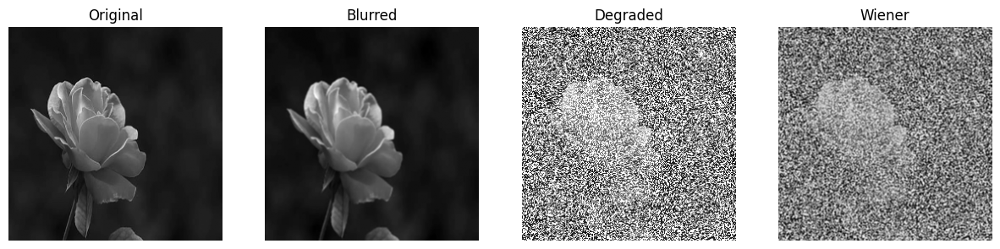

In [71]:
fig, axes = plt.subplots(1, 4, figsize=(15, 9))
images = [image, blurred, degraded, wiener_restored]
titles = ["Original", "Blurred", "Degraded", "Wiener"]

for i, ax in enumerate(axes.flat[:4]):
    ax.imshow(images[i], cmap='gray')
    ax.set_title(titles[i])
    ax.axis('off')

psnr_wiener = psnr(image, wiener_restored)
print(f"PSNR (Wiener): {psnr_wiener:.2f} dB")

## Maximum A Posteriori (MAP)

In [72]:
def map_estimation(degraded, sigma_noise=25):
    return gaussian_filter(degraded, sigma=1)


map_restored = map_estimation(degraded)

PSNR (MAP): 6.97 dB


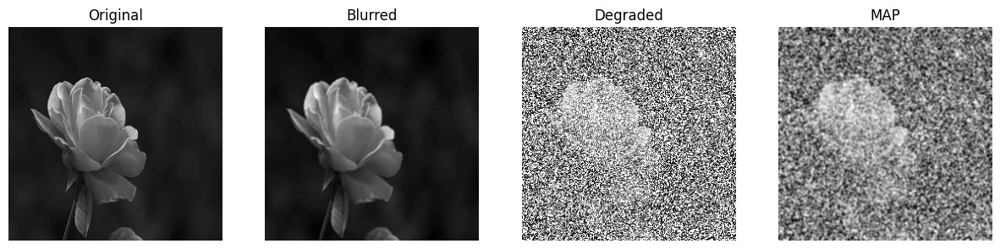

In [73]:
fig, axes = plt.subplots(1, 4, figsize=(15, 9))
images = [image, blurred, degraded, map_restored]
titles = ["Original", "Blurred", "Degraded", "MAP"]

for i, ax in enumerate(axes.flat[:4]):
    ax.imshow(images[i], cmap='gray')
    ax.set_title(titles[i])
    ax.axis('off')

psnr_map = psnr(image, map_restored)
print(f"PSNR (MAP): {psnr_map:.2f} dB")

## Maximum Likelihood Estimation (MLE)

In [77]:
def mle_estimation(degraded):
    mu = np.mean(degraded)
    sigma = np.std(degraded)
    restored = np.clip((degraded - mu) / sigma, 0, 255)
    return restored, mu, sigma


mle_restored, mu, sigma = mle_estimation(degraded)
print(mu, sigma)

153.87054443359375 98.20858052316746


<ipython-input-78-d328c53e94b5>:10: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_mle = psnr(image, mle_restored)


PSNR (MLE): 14.08 dB


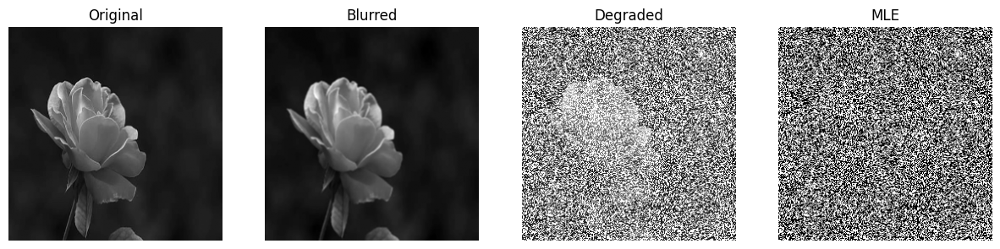

In [78]:
fig, axes = plt.subplots(1, 4, figsize=(15, 9))
images = [image, blurred, degraded, mle_restored]
titles = ["Original", "Blurred", "Degraded", "MLE"]

for i, ax in enumerate(axes.flat[:4]):
    ax.imshow(images[i], cmap='gray')
    ax.set_title(titles[i])
    ax.axis('off')

psnr_mle = psnr(image, mle_restored)
print(f"PSNR (MLE): {psnr_mle:.2f} dB")